# STEP 1 — Detection Dataset Preparation Setup

In [1]:
!pip -q install kagglehub

# STEP 2 — Imports and Reproducibility

In [2]:
import json
import hashlib
import random
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
import cv2

from tqdm.auto import tqdm

SEED = 42

random.seed(SEED)
np.random.seed(SEED)

# STEP 3 — Download PlantVillage Dataset

In [3]:
import kagglehub

download_path = kagglehub.dataset_download(
    "abdallahalidev/plantvillage-dataset"
)

print(download_path)

Using Colab cache for faster access to the 'plantvillage-dataset' dataset.
/kaggle/input/plantvillage-dataset


# STEP 4 — Detect Dataset Root

In [4]:
base_path = Path(download_path)


def find_dataset_root(base):

    required = {
        "color",
        "grayscale",
        "segmented"
    }

    candidates = [base]

    candidates.extend(
        p
        for p in base.rglob("*")
        if p.is_dir()
    )

    for path in candidates:

        try:

            folders = {
                x.name
                for x in path.iterdir()
                if x.is_dir()
            }

            if required.issubset(folders):
                return path

        except PermissionError:
            continue

    return None


dataset_root = find_dataset_root(
    base_path
)


print(
    "Dataset root:",
    dataset_root
)


assert dataset_root is not None
assert (dataset_root / "color").exists()
assert (dataset_root / "segmented").exists()

print("✅ Dataset structure found.")

Dataset root: /kaggle/input/plantvillage-dataset/plantvillage dataset
✅ Dataset structure found.


# STEP 5 — Mount Google Drive

In [5]:
from google.colab import drive

drive.mount(
    "/content/drive"
)


SEGMENTATION_PROJECT_DIR = Path(
    "/content/drive/MyDrive/"
    "PlantVillage_Segmentation"
)


DETECTION_PROJECT_DIR = Path(
    "/content/drive/MyDrive/"
    "PlantVillage_Detection"
)


DETECTION_PROJECT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


print(
    "Segmentation project:",
    SEGMENTATION_PROJECT_DIR
)

print(
    "Detection project:",
    DETECTION_PROJECT_DIR
)

Mounted at /content/drive
Segmentation project: /content/drive/MyDrive/PlantVillage_Segmentation
Detection project: /content/drive/MyDrive/PlantVillage_Detection


# STEP 6 — Load Final QC-Approved PlantVillage Manifest

In [6]:
FINAL_SEGMENTATION_MANIFEST = (
    SEGMENTATION_PROJECT_DIR /
    "final_segmentation_manifest.csv"
)

FINAL_SEGMENTATION_CONFIG = (
    SEGMENTATION_PROJECT_DIR /
    "segmentation_preprocessing_config.json"
)


assert FINAL_SEGMENTATION_MANIFEST.exists()
assert FINAL_SEGMENTATION_CONFIG.exists()


final_df = pd.read_csv(
    FINAL_SEGMENTATION_MANIFEST
)


with open(
    FINAL_SEGMENTATION_CONFIG,
    "r"
) as f:

    segmentation_config = json.load(f)


print(
    "Total samples:",
    len(final_df)
)

print()

print(
    final_df["split"].value_counts()
)

print()

print(
    "Classes:",
    final_df["class"].nunique()
)

Total samples: 52969

split
train    42371
val       5300
test      5298
Name: count, dtype: int64

Classes: 38


# STEP 7 — Recreate Final Leaf Mask

In [7]:
BLACK_THRESHOLD = int(
    segmentation_config[
        "black_threshold"
    ]
)


print(
    "Black threshold:",
    BLACK_THRESHOLD
)


assert BLACK_THRESHOLD == 15


def create_leaf_mask(
    segmented_rgb,
    target_height,
    target_width,
    black_threshold=15
):

    segmented_rgb = np.asarray(
        segmented_rgb,
        dtype=np.uint8
    )


    mask = (
        np.max(
            segmented_rgb,
            axis=2
        )
        >
        black_threshold
    ).astype(np.uint8)


    if mask.shape != (
        target_height,
        target_width
    ):

        mask = cv2.resize(
            mask,
            (
                target_width,
                target_height
            ),
            interpolation=cv2.INTER_NEAREST
        )


    return mask

Black threshold: 15


# STEP 8 — Define Tight Leaf Bounding Box Extraction

In [8]:
def mask_to_bbox(mask):

    """
    Convert binary leaf mask into
    one tight bounding box.

    Returns:
        xmin, ymin, xmax, ymax

    xmax/ymax are exclusive coordinates.
    """

    ys, xs = np.where(
        mask > 0
    )


    if len(xs) == 0 or len(ys) == 0:
        return None


    xmin = int(xs.min())
    ymin = int(ys.min())

    xmax = int(xs.max()) + 1
    ymax = int(ys.max()) + 1


    return (
        xmin,
        ymin,
        xmax,
        ymax
    )

# STEP 9 — Define YOLO Bounding Box Conversion

In [9]:
def bbox_to_yolo(
    bbox,
    image_width,
    image_height
):

    xmin, ymin, xmax, ymax = bbox


    box_width = (
        xmax - xmin
    )

    box_height = (
        ymax - ymin
    )


    x_center = (
        xmin + xmax
    ) / 2.0

    y_center = (
        ymin + ymax
    ) / 2.0


    x_center /= image_width
    y_center /= image_height

    box_width /= image_width
    box_height /= image_height


    return (
        x_center,
        y_center,
        box_width,
        box_height
    )

# STEP 10 — Create Fixed Detection Class Mapping

In [10]:
class_names = sorted(
    final_df[
        "class"
    ].unique()
)


class_to_id = {
    class_name: class_id

    for class_id, class_name
    in enumerate(class_names)
}


id_to_class = {
    class_id: class_name

    for class_name, class_id
    in class_to_id.items()
}


print(
    "Classes:",
    len(class_names)
)


for i, class_name in enumerate(
    class_names[:10]
):

    print(
        i,
        class_name
    )

Classes: 38
0 Apple___Apple_scab
1 Apple___Black_rot
2 Apple___Cedar_apple_rust
3 Apple___healthy
4 Blueberry___healthy
5 Cherry_(including_sour)___Powdery_mildew
6 Cherry_(including_sour)___healthy
7 Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
8 Corn_(maize)___Common_rust_
9 Corn_(maize)___Northern_Leaf_Blight


In [11]:
CLASS_MAP_PATH = (
    DETECTION_PROJECT_DIR /
    "detection_class_map.json"
)


with open(
    CLASS_MAP_PATH,
    "w"
) as f:

    json.dump(
        {
            "class_to_id":
                class_to_id,

            "id_to_class":
                {
                    str(k): v
                    for k, v
                    in id_to_class.items()
                }
        },
        f,
        indent=4
    )


print(
    "Saved:",
    CLASS_MAP_PATH
)

Saved: /content/drive/MyDrive/PlantVillage_Detection/detection_class_map.json


# STEP 11 — Generate Tight Leaf Bounding Boxes

In [12]:
detection_rows = []

invalid_rows = []


for row in tqdm(
    final_df.itertuples(
        index=False
    ),
    total=len(final_df)
):


    color_path = (
        dataset_root /
        row.color_rel
    )

    segmented_path = (
        dataset_root /
        row.segmented_rel
    )


    color = np.array(
        Image.open(
            color_path
        ).convert("RGB")
    )


    segmented = np.array(
        Image.open(
            segmented_path
        ).convert("RGB")
    )


    height, width = (
        color.shape[:2]
    )


    mask = create_leaf_mask(
        segmented_rgb=segmented,
        target_height=height,
        target_width=width,
        black_threshold=BLACK_THRESHOLD
    )


    bbox = mask_to_bbox(
        mask
    )


    if bbox is None:

        invalid_rows.append({
            "class":
                row[0],

            "color_rel":
                row.color_rel,

            "segmented_rel":
                row.segmented_rel,

            "reason":
                "empty_mask"
        })

        continue


    xmin, ymin, xmax, ymax = bbox


    box_width_pixels = (
        xmax - xmin
    )

    box_height_pixels = (
        ymax - ymin
    )


    box_area_ratio = (
        box_width_pixels
        *
        box_height_pixels
    ) / (
        width * height
    )


    (
        x_center,
        y_center,
        box_width,
        box_height
    ) = bbox_to_yolo(
        bbox=bbox,
        image_width=width,
        image_height=height
    )


    class_name = row[0]

    class_id = class_to_id[
        class_name
    ]


    stable_id = hashlib.sha1(
        row.color_rel.encode(
            "utf-8"
        )
    ).hexdigest()[:16]


    detection_rows.append({

        "sample_id":
            stable_id,

        "class":
            class_name,

        "class_id":
            class_id,

        "split":
            row.split,

        "color_rel":
            row.color_rel,

        "segmented_rel":
            row.segmented_rel,

        "image_width":
            width,

        "image_height":
            height,

        "xmin":
            xmin,

        "ymin":
            ymin,

        "xmax":
            xmax,

        "ymax":
            ymax,

        "x_center":
            x_center,

        "y_center":
            y_center,

        "box_width":
            box_width,

        "box_height":
            box_height,

        "box_area_ratio":
            box_area_ratio
    })

  0%|          | 0/52969 [00:00<?, ?it/s]

In [13]:
detection_df = pd.DataFrame(
    detection_rows
)


invalid_df = pd.DataFrame(
    invalid_rows
)


print(
    "Source samples:",
    len(final_df)
)

print(
    "Detection boxes:",
    len(detection_df)
)

print(
    "Invalid boxes:",
    len(invalid_df)
)

Source samples: 52969
Detection boxes: 52969
Invalid boxes: 0


# STEP 12 — Numerical Bounding Box QC

In [14]:
qc_checks = {

    "invalid_class_id":
        (
            (
                detection_df[
                    "class_id"
                ] < 0
            )
            |
            (
                detection_df[
                    "class_id"
                ] >= 38
            )
        ).sum(),


    "invalid_x_center":
        (
            (
                detection_df[
                    "x_center"
                ] < 0
            )
            |
            (
                detection_df[
                    "x_center"
                ] > 1
            )
        ).sum(),


    "invalid_y_center":
        (
            (
                detection_df[
                    "y_center"
                ] < 0
            )
            |
            (
                detection_df[
                    "y_center"
                ] > 1
            )
        ).sum(),


    "invalid_width":
        (
            (
                detection_df[
                    "box_width"
                ] <= 0
            )
            |
            (
                detection_df[
                    "box_width"
                ] > 1
            )
        ).sum(),


    "invalid_height":
        (
            (
                detection_df[
                    "box_height"
                ] <= 0
            )
            |
            (
                detection_df[
                    "box_height"
                ] > 1
            )
        ).sum(),


    "duplicate_sample_id":
        detection_df[
            "sample_id"
        ].duplicated().sum()
}


for key, value in qc_checks.items():

    print(
        key,
        ":",
        value
    )

invalid_class_id : 0
invalid_x_center : 0
invalid_y_center : 0
invalid_width : 0
invalid_height : 0
duplicate_sample_id : 0


# STEP 13 — Verify Fixed Detection Split

In [15]:
print(
    detection_df[
        "split"
    ].value_counts()
)


print()

print(
    "Classes:",
    detection_df[
        "class"
    ].nunique()
)

split
train    42371
val       5300
test      5298
Name: count, dtype: int64

Classes: 38


# STEP 14 — Inspect Bounding Box Statistics

In [16]:
display(
    detection_df[
        [
            "box_width",
            "box_height",
            "box_area_ratio"
        ]
    ].describe()
)

,box_width,box_height,box_area_ratio
count,52969.000000,52969.000000,52969.000000
mean,0.829969,0.913284,0.762424
std,0.115927,0.074156,0.141100
min,0.144531,0.082031,0.015244
25%,0.769531,0.878906,0.685242
50%,0.851562,0.929688,0.781311
75%,0.914062,0.964844,0.863281
max,1.000000,1.000000,1.000000


In [17]:
print("Smallest boxes:")

display(
    detection_df
    .sort_values(
        "box_area_ratio"
    )
    [
        [
            "class",
            "box_area_ratio",
            "box_width",
            "box_height"
        ]
    ]
    .head(10)
)


print("Largest boxes:")

display(
    detection_df
    .sort_values(
        "box_area_ratio",
        ascending=False
    )
    [
        [
            "class",
            "box_area_ratio",
            "box_width",
            "box_height"
        ]
    ]
    .head(10)
)

Smallest boxes:


,class,box_area_ratio,box_width,box_height
27253,Grape___Black_rot,0.015244,0.144531,0.105469
48699,Tomato___Septoria_leaf_spot,0.018585,0.164062,0.113281
40231,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.019226,0.234375,0.082031
37671,Tomato___Tomato_Yellow_Leaf_Curl_Virus,0.039444,0.183594,0.214844
28841,"Pepper,_bell___healthy",0.042297,0.246094,0.171875
46352,Tomato___Septoria_leaf_spot,0.042908,0.289062,0.148438
30324,Tomato___Tomato_Yellow_Leaf_Curl_Virus,0.057678,0.246094,0.234375
36931,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.061462,0.296875,0.207031
2667,"Pepper,_bell___healthy",0.063889,0.308594,0.207031
4715,"Pepper,_bell___healthy",0.066406,0.265625,0.250000


Largest boxes:


,class,box_area_ratio,box_width,box_height
43347,Soybean___healthy,1.0,1.0,1.0
52905,Peach___Bacterial_spot,1.0,1.0,1.0
21296,Corn_(maize)___Common_rust_,1.0,1.0,1.0
21285,Squash___Powdery_mildew,1.0,1.0,1.0
43381,Corn_(maize)___Common_rust_,1.0,1.0,1.0
43216,Squash___Powdery_mildew,1.0,1.0,1.0
43207,Corn_(maize)___Common_rust_,1.0,1.0,1.0
6578,Corn_(maize)___Common_rust_,1.0,1.0,1.0
6592,Squash___Powdery_mildew,1.0,1.0,1.0
6629,Corn_(maize)___Common_rust_,1.0,1.0,1.0


# STEP 15 — Visual Verification of Tight Leaf Boxes

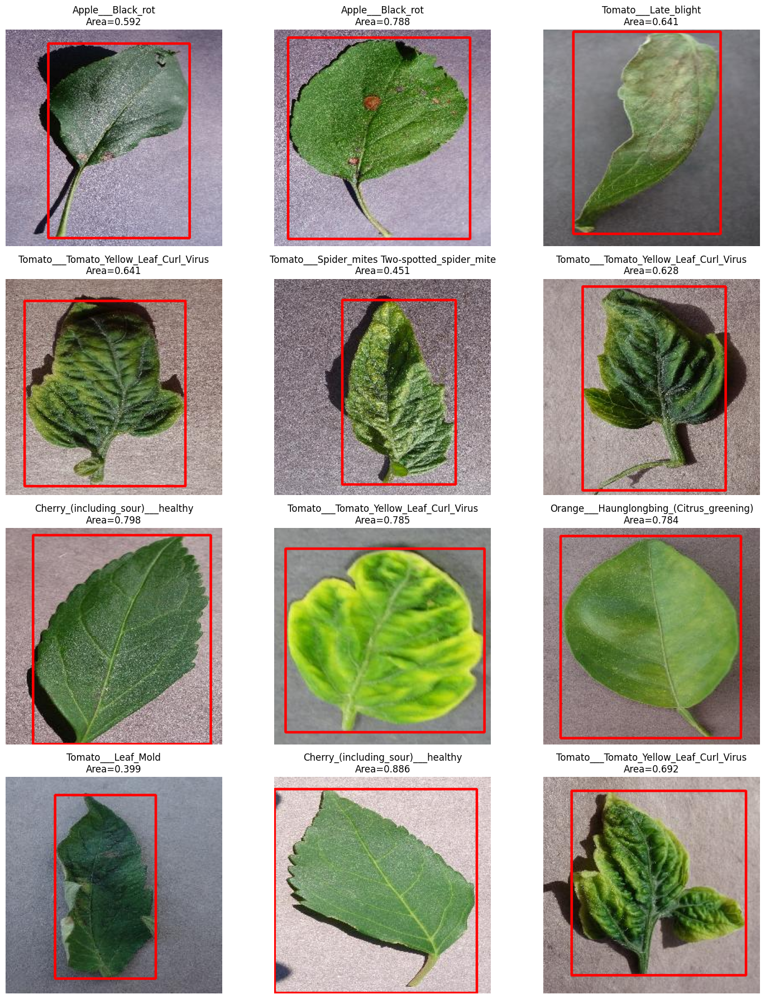

In [18]:
preview_df = detection_df.sample(
    n=12,
    random_state=SEED
).reset_index(drop=True)


fig, axes = plt.subplots(
    4,
    3,
    figsize=(15, 18)
)


axes = axes.flatten()


for i, row in preview_df.iterrows():


    image = np.array(
        Image.open(
            dataset_root /
            row["color_rel"]
        ).convert("RGB")
    )


    xmin = int(
        row["xmin"]
    )

    ymin = int(
        row["ymin"]
    )

    xmax = int(
        row["xmax"]
    )

    ymax = int(
        row["ymax"]
    )


    display_img = (
        image.copy()
    )


    cv2.rectangle(
        display_img,
        (
            xmin,
            ymin
        ),
        (
            xmax - 1,
            ymax - 1
        ),
        (
            255,
            0,
            0
        ),
        2
    )


    axes[i].imshow(
        display_img
    )

    axes[i].set_title(
        f"{row['class']}\n"
        f"Area={row['box_area_ratio']:.3f}"
    )

    axes[i].axis(
        "off"
    )


plt.tight_layout()
plt.show()

# STEP 16 — Inspect Bounding Box Extremes

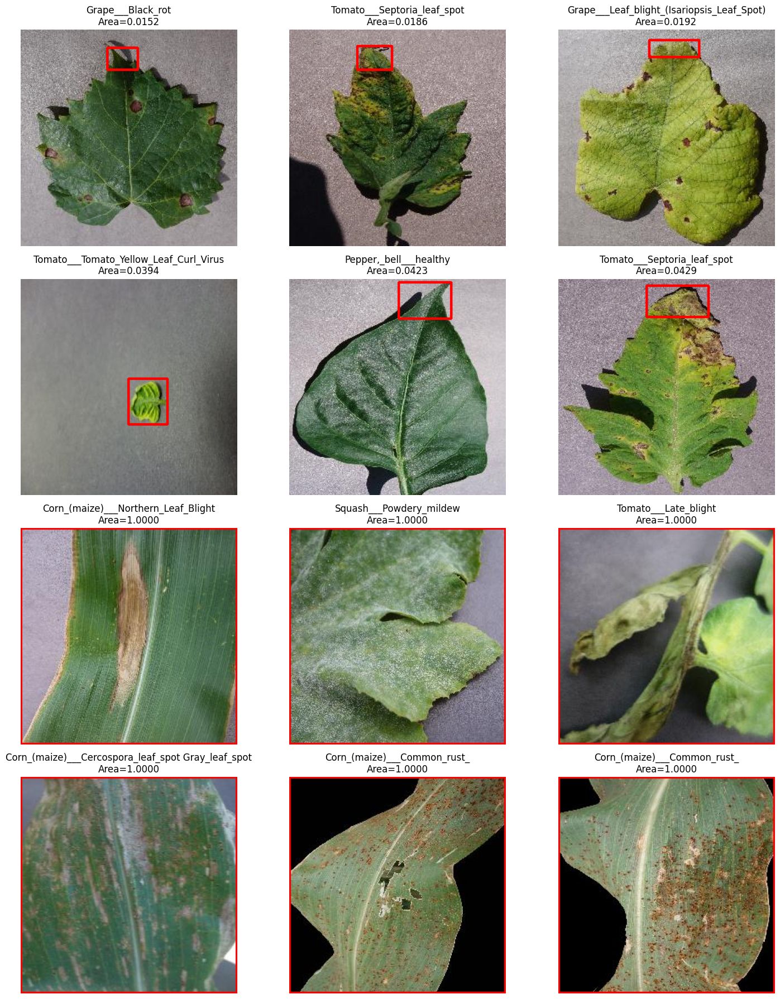

In [19]:
smallest = (
    detection_df
    .nsmallest(
        6,
        "box_area_ratio"
    )
)


largest = (
    detection_df
    .nlargest(
        6,
        "box_area_ratio"
    )
)


extreme_df = pd.concat(
    [
        smallest,
        largest
    ],
    ignore_index=True
)


fig, axes = plt.subplots(
    4,
    3,
    figsize=(15, 18)
)


axes = axes.flatten()


for i, row in extreme_df.iterrows():


    image = np.array(
        Image.open(
            dataset_root /
            row["color_rel"]
        ).convert("RGB")
    )


    display_img = image.copy()


    cv2.rectangle(
        display_img,
        (
            int(row["xmin"]),
            int(row["ymin"])
        ),
        (
            int(row["xmax"]) - 1,
            int(row["ymax"]) - 1
        ),
        (
            255,
            0,
            0
        ),
        2
    )


    axes[i].imshow(
        display_img
    )


    axes[i].set_title(
        f"{row['class']}\n"
        f"Area={row['box_area_ratio']:.4f}"
    )


    axes[i].axis(
        "off"
    )


plt.tight_layout()
plt.show()

# STEP 17 — Save Final Detection Manifest

In [20]:
FINAL_DETECTION_MANIFEST = (
    DETECTION_PROJECT_DIR /
    "final_detection_manifest.csv"
)


detection_df.to_csv(
    FINAL_DETECTION_MANIFEST,
    index=False
)


print(
    "Saved:",
    FINAL_DETECTION_MANIFEST
)

Saved: /content/drive/MyDrive/PlantVillage_Detection/final_detection_manifest.csv


# STEP 18 — Save Detection Preprocessing Configuration

In [21]:
detection_config = {

    "task":
        "leaf-level disease detection",

    "source_dataset":
        "PlantVillage",

    "bbox_source":
        "QC-approved segmented leaf masks",

    "bbox_type":
        "tight leaf bounding box",

    "mask_threshold":
        BLACK_THRESHOLD,

    "total_samples":
        len(detection_df),

    "classes":
        int(
            detection_df[
                "class"
            ].nunique()
        ),

    "train_samples":
        int(
            (
                detection_df[
                    "split"
                ]
                ==
                "train"
            ).sum()
        ),

    "validation_samples":
        int(
            (
                detection_df[
                    "split"
                ]
                ==
                "val"
            ).sum()
        ),

    "test_samples":
        int(
            (
                detection_df[
                    "split"
                ]
                ==
                "test"
            ).sum()
        ),

    "random_seed":
        SEED,

    "bounding_box_generation":
        "minimum enclosing axis-aligned rectangle around foreground pixels",

    "yolo_format":
        "class_id x_center y_center width height",

    "coordinates_normalized":
        True,

    "manual_bbox_annotation":
        False,

    "lesion_level_detection":
        False,

    "detection_level":
        "whole leaf with PlantVillage disease class"
}


DETECTION_CONFIG_PATH = (
    DETECTION_PROJECT_DIR /
    "detection_preprocessing_config.json"
)


with open(
    DETECTION_CONFIG_PATH,
    "w"
) as f:

    json.dump(
        detection_config,
        f,
        indent=4
    )


print(
    "Saved:",
    DETECTION_CONFIG_PATH
)

Saved: /content/drive/MyDrive/PlantVillage_Detection/detection_preprocessing_config.json


# STEP 19 — Save Detection QC Visualization

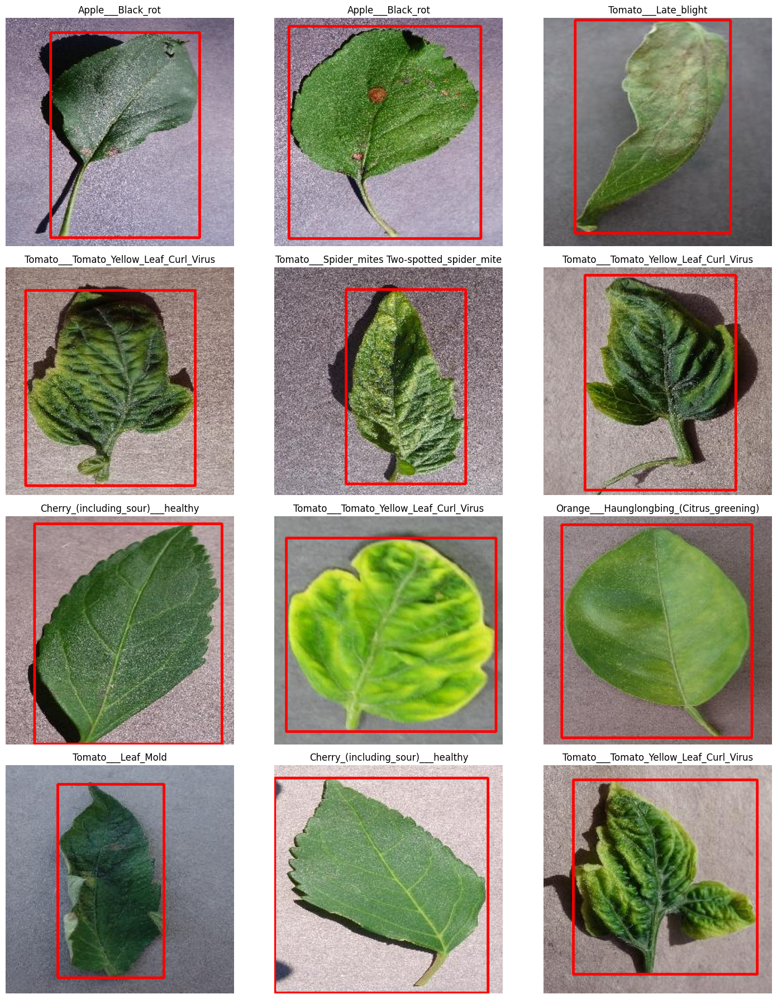

Saved: /content/drive/MyDrive/PlantVillage_Detection/tight_bbox_qc_examples.png


In [22]:
preview_df = detection_df.sample(
    n=12,
    random_state=SEED
).reset_index(drop=True)


fig, axes = plt.subplots(
    4,
    3,
    figsize=(15, 18)
)


axes = axes.flatten()


for i, row in preview_df.iterrows():


    image = np.array(
        Image.open(
            dataset_root /
            row["color_rel"]
        ).convert("RGB")
    )


    display_img = image.copy()


    cv2.rectangle(
        display_img,
        (
            int(row["xmin"]),
            int(row["ymin"])
        ),
        (
            int(row["xmax"]) - 1,
            int(row["ymax"]) - 1
        ),
        (
            255,
            0,
            0
        ),
        2
    )


    axes[i].imshow(
        display_img
    )


    axes[i].set_title(
        row["class"]
    )


    axes[i].axis(
        "off"
    )


plt.tight_layout()


QC_FIGURE_PATH = (
    DETECTION_PROJECT_DIR /
    "tight_bbox_qc_examples.png"
)


plt.savefig(
    QC_FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


print(
    "Saved:",
    QC_FIGURE_PATH
)

# STEP 20 — Final Detection Preprocessing Check

In [23]:
important_files = [

    FINAL_DETECTION_MANIFEST,

    DETECTION_CONFIG_PATH,

    CLASS_MAP_PATH,

    QC_FIGURE_PATH
]


for path in important_files:

    print(
        "✅"
        if Path(path).exists()
        else "❌",
        path
    )

✅ /content/drive/MyDrive/PlantVillage_Detection/final_detection_manifest.csv
✅ /content/drive/MyDrive/PlantVillage_Detection/detection_preprocessing_config.json
✅ /content/drive/MyDrive/PlantVillage_Detection/detection_class_map.json
✅ /content/drive/MyDrive/PlantVillage_Detection/tight_bbox_qc_examples.png


# STEP 21 — Flag Suspicious Bounding Boxes for Manual QC



In [24]:
suspicious_mask = (
    (detection_df["box_area_ratio"] < 0.10)
    |
    (detection_df["box_width"] < 0.20)
    |
    (detection_df["box_height"] < 0.15)
)

suspicious_df = (
    detection_df[
        suspicious_mask
    ]
    .copy()
    .sort_values(
        "box_area_ratio"
    )
    .reset_index(drop=True)
)

print(
    "Total detection samples:",
    len(detection_df)
)

print(
    "Suspicious candidates:",
    len(suspicious_df)
)

print(
    "Percentage:",
    round(
        100 * len(suspicious_df)
        / len(detection_df),
        4
    ),
    "%"
)

display(
    suspicious_df[
        [
            "sample_id",
            "class",
            "split",
            "box_area_ratio",
            "box_width",
            "box_height",
            "color_rel"
        ]
    ].head(30)
)

Total detection samples: 52969
Suspicious candidates: 15
Percentage: 0.0283 %


,sample_id,class,split,box_area_ratio,box_width,box_height,color_rel
0,7501a9785d782859,Grape___Black_rot,test,0.015244,0.144531,0.105469,color/Grape___Black_rot/82f7d3a6-0f57-44bc-93b...
1,3f1ac04f5c618dbf,Tomato___Septoria_leaf_spot,train,0.018585,0.164062,0.113281,color/Tomato___Septoria_leaf_spot/8b9ca191-719...
2,71c0c154b7c65ff8,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),train,0.019226,0.234375,0.082031,color/Grape___Leaf_blight_(Isariopsis_Leaf_Spo...
3,d1259bf6595b9d3f,Tomato___Tomato_Yellow_Leaf_Curl_Virus,train,0.039444,0.183594,0.214844,color/Tomato___Tomato_Yellow_Leaf_Curl_Virus/9...
4,c9379cc7987680db,"Pepper,_bell___healthy",train,0.042297,0.246094,0.171875,"color/Pepper,_bell___healthy/fa07a6ab-030d-46d..."
5,4a42a4eff988c72d,Tomato___Septoria_leaf_spot,train,0.042908,0.289062,0.148438,color/Tomato___Septoria_leaf_spot/85bec8de-565...
6,e84d456e0da7a12e,Tomato___Tomato_Yellow_Leaf_Curl_Virus,train,0.057678,0.246094,0.234375,color/Tomato___Tomato_Yellow_Leaf_Curl_Virus/3...
7,5140be51a45a313d,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),train,0.061462,0.296875,0.207031,color/Grape___Leaf_blight_(Isariopsis_Leaf_Spo...
8,6e132ad00f15470a,"Pepper,_bell___healthy",train,0.063889,0.308594,0.207031,"color/Pepper,_bell___healthy/4cdfdfb8-1efa-4a4..."
9,10d87785c73ff58d,"Pepper,_bell___healthy",train,0.066406,0.265625,0.250000,"color/Pepper,_bell___healthy/b3f3c64e-d3f1-42e..."


# STEP 22 — Generate Suspicious-Box Contact Sheets


In [25]:
CONTACT_SHEET_DIR = (
    DETECTION_PROJECT_DIR /
    "bbox_qc_contact_sheets"
)

CONTACT_SHEET_DIR.mkdir(
    parents=True,
    exist_ok=True
)

IMAGES_PER_SHEET = 12


def save_contact_sheet(
    subset_df,
    sheet_number
):

    rows = 4
    cols = 3

    fig, axes = plt.subplots(
        rows,
        cols,
        figsize=(15, 18)
    )

    axes = axes.flatten()


    for ax in axes:
        ax.axis("off")


    for i, (_, row) in enumerate(
        subset_df.iterrows()
    ):

        image = np.array(
            Image.open(
                dataset_root /
                row["color_rel"]
            ).convert("RGB")
        )


        display_img = image.copy()


        cv2.rectangle(
            display_img,
            (
                int(row["xmin"]),
                int(row["ymin"])
            ),
            (
                int(row["xmax"]) - 1,
                int(row["ymax"]) - 1
            ),
            (
                255,
                0,
                0
            ),
            2
        )


        axes[i].imshow(
            display_img
        )

        axes[i].set_title(
            f"ID: {row['sample_id']}\n"
            f"{row['class']}\n"
            f"Area={row['box_area_ratio']:.4f}",
            fontsize=8
        )

        axes[i].axis("off")


    plt.tight_layout()


    save_path = (
        CONTACT_SHEET_DIR /
        f"suspicious_boxes_{sheet_number:03d}.png"
    )


    plt.savefig(
        save_path,
        dpi=200,
        bbox_inches="tight"
    )

    plt.close()


    return save_path


saved_sheets = []

for start in tqdm(
    range(
        0,
        len(suspicious_df),
        IMAGES_PER_SHEET
    )
):

    subset = suspicious_df.iloc[
        start:
        start + IMAGES_PER_SHEET
    ]

    sheet_number = (
        start // IMAGES_PER_SHEET
    ) + 1

    path = save_contact_sheet(
        subset,
        sheet_number
    )

    saved_sheets.append(
        path
    )


print(
    f"✅ Created {len(saved_sheets)} "
    "contact sheets."
)

print(
    "Saved in:",
    CONTACT_SHEET_DIR
)

  0%|          | 0/2 [00:00<?, ?it/s]

✅ Created 2 contact sheets.
Saved in: /content/drive/MyDrive/PlantVillage_Detection/bbox_qc_contact_sheets


# STEP 23 — Save Suspicious Candidate List


In [26]:
SUSPICIOUS_CSV = (
    DETECTION_PROJECT_DIR /
    "detection_bbox_qc_candidates.csv"
)

suspicious_df.to_csv(
    SUSPICIOUS_CSV,
    index=False
)

print(
    "Saved:",
    SUSPICIOUS_CSV
)

Saved: /content/drive/MyDrive/PlantVillage_Detection/detection_bbox_qc_candidates.csv


# STEP 24 — Record Manual Bounding Box QC Decisions


In [27]:
KEEP_IDS = {
    "d1259bf6595b9d3f",
    "e84d456e0da7a12e",
    "88ef735514f34508",
    "aa2774599bebd59d",
    "7fea082638f3279a",
}


EXCLUDE_IDS = {
    "7501a9785d782859",
    "3f1ac04f5c618dbf",
    "71c0c154b7c65ff8",
    "c9379cc7987680db",
    "4a42a4eff988c72d",
    "5140be51a45a313d",
    "6e132ad00f15470a",
    "10d87785c73ff58d",
    "1b1ad92f5b833443",
    "47082f0fa16d7509",
}


print("KEEP:", len(KEEP_IDS))
print("EXCLUDE:", len(EXCLUDE_IDS))
print("TOTAL REVIEWED:", len(KEEP_IDS | EXCLUDE_IDS))


assert len(KEEP_IDS) == 5
assert len(EXCLUDE_IDS) == 10
assert len(KEEP_IDS & EXCLUDE_IDS) == 0
assert len(KEEP_IDS | EXCLUDE_IDS) == 15

KEEP: 5
EXCLUDE: 10
TOTAL REVIEWED: 15


# STEP 25 — Verify Manual QC Coverage



In [28]:
suspicious_ids = set(
    suspicious_df[
        "sample_id"
    ].astype(str)
)


reviewed_ids = (
    KEEP_IDS |
    EXCLUDE_IDS
)


not_reviewed = (
    suspicious_ids -
    reviewed_ids
)


unexpected_ids = (
    reviewed_ids -
    suspicious_ids
)


print(
    "Suspicious candidates:",
    len(suspicious_ids)
)

print(
    "Reviewed:",
    len(reviewed_ids)
)

print(
    "Not reviewed:",
    not_reviewed
)

print(
    "Unexpected IDs:",
    unexpected_ids
)


assert len(not_reviewed) == 0
assert len(unexpected_ids) == 0


print(
    "✅ All 15 suspicious candidates "
    "have final QC decisions."
)

Suspicious candidates: 15
Reviewed: 15
Not reviewed: set()
Unexpected IDs: set()
✅ All 15 suspicious candidates have final QC decisions.


# STEP 26 — Save QC Decision Table

In [29]:
qc_decision_rows = []


for _, row in suspicious_df.iterrows():

    sample_id = str(
        row["sample_id"]
    )


    if sample_id in EXCLUDE_IDS:

        decision = "EXCLUDE"

        reason = (
            "Mask-derived bounding box "
            "covers only a small portion "
            "of the visible leaf and is "
            "not valid full-leaf detection supervision."
        )


    elif sample_id in KEEP_IDS:

        decision = "KEEP"

        reason = (
            "Small/narrow object is genuine "
            "and the bounding box correctly "
            "covers the visible leaf."
        )


    else:

        raise RuntimeError(
            f"Unreviewed sample: {sample_id}"
        )


    qc_decision_rows.append({

        **row.to_dict(),

        "manual_qc_decision":
            decision,

        "manual_qc_reason":
            reason
    })


qc_decisions_df = pd.DataFrame(
    qc_decision_rows
)


QC_DECISIONS_PATH = (
    DETECTION_PROJECT_DIR /
    "detection_bbox_qc_decisions.csv"
)


qc_decisions_df.to_csv(
    QC_DECISIONS_PATH,
    index=False
)


display(
    qc_decisions_df[
        [
            "sample_id",
            "class",
            "split",
            "box_area_ratio",
            "manual_qc_decision"
        ]
    ]
)


print(
    "Saved:",
    QC_DECISIONS_PATH
)

,sample_id,class,split,box_area_ratio,manual_qc_decision
0,7501a9785d782859,Grape___Black_rot,test,0.015244,EXCLUDE
1,3f1ac04f5c618dbf,Tomato___Septoria_leaf_spot,train,0.018585,EXCLUDE
2,71c0c154b7c65ff8,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),train,0.019226,EXCLUDE
3,d1259bf6595b9d3f,Tomato___Tomato_Yellow_Leaf_Curl_Virus,train,0.039444,KEEP
4,c9379cc7987680db,"Pepper,_bell___healthy",train,0.042297,EXCLUDE
5,4a42a4eff988c72d,Tomato___Septoria_leaf_spot,train,0.042908,EXCLUDE
6,e84d456e0da7a12e,Tomato___Tomato_Yellow_Leaf_Curl_Virus,train,0.057678,KEEP
7,5140be51a45a313d,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),train,0.061462,EXCLUDE
8,6e132ad00f15470a,"Pepper,_bell___healthy",train,0.063889,EXCLUDE
9,10d87785c73ff58d,"Pepper,_bell___healthy",train,0.066406,EXCLUDE


Saved: /content/drive/MyDrive/PlantVillage_Detection/detection_bbox_qc_decisions.csv


# STEP 27 — Create Final Detection Manifest V2


In [30]:
final_detection_df = (
    detection_df[
        ~detection_df[
            "sample_id"
        ].astype(str).isin(
            EXCLUDE_IDS
        )
    ]
    .copy()
    .reset_index(drop=True)
)


print(
    "Before manual QC:",
    len(detection_df)
)

print(
    "Excluded:",
    len(EXCLUDE_IDS)
)

print(
    "Final detection samples:",
    len(final_detection_df)
)


assert len(detection_df) == 52969
assert len(final_detection_df) == 52959


print()
print("Final split counts:")

print(
    final_detection_df[
        "split"
    ].value_counts()
)


print()

print(
    "Final classes:",
    final_detection_df[
        "class"
    ].nunique()
)


assert (
    final_detection_df[
        "class"
    ].nunique()
    ==
    38
)


assert (
    final_detection_df[
        "sample_id"
    ].duplicated().sum()
    ==
    0
)


print(
    "✅ Final detection dataset created."
)

Before manual QC: 52969
Excluded: 10
Final detection samples: 52959

Final split counts:
split
train    42363
val       5300
test      5296
Name: count, dtype: int64

Final classes: 38
✅ Final detection dataset created.


# STEP 28 — Save Final Detection QC Exclusions



In [31]:
detection_exclusions_df = (
    qc_decisions_df[
        qc_decisions_df[
            "manual_qc_decision"
        ]
        ==
        "EXCLUDE"
    ]
    .copy()
    .reset_index(drop=True)
)


DETECTION_EXCLUSIONS_PATH = (
    DETECTION_PROJECT_DIR /
    "detection_bbox_qc_exclusions.csv"
)


detection_exclusions_df.to_csv(
    DETECTION_EXCLUSIONS_PATH,
    index=False
)


print(
    "Excluded samples:",
    len(detection_exclusions_df)
)

print(
    "Saved:",
    DETECTION_EXCLUSIONS_PATH
)

Excluded samples: 10
Saved: /content/drive/MyDrive/PlantVillage_Detection/detection_bbox_qc_exclusions.csv


# STEP 29 — Save Final Detection Manifest V2


In [32]:
FINAL_DETECTION_MANIFEST_V2 = (
    DETECTION_PROJECT_DIR /
    "final_detection_manifest_v2.csv"
)


final_detection_df.to_csv(
    FINAL_DETECTION_MANIFEST_V2,
    index=False
)


print(
    "Saved:",
    FINAL_DETECTION_MANIFEST_V2
)

print(
    "Samples:",
    len(final_detection_df)
)

Saved: /content/drive/MyDrive/PlantVillage_Detection/final_detection_manifest_v2.csv
Samples: 52959


# STEP 30 — Final Detection Manifest V2 QC


In [33]:
final_qc = {

    "total_samples":
        len(final_detection_df),

    "classes":
        final_detection_df[
            "class"
        ].nunique(),

    "duplicate_sample_ids":
        final_detection_df[
            "sample_id"
        ].duplicated().sum(),

    "invalid_class_ids":
        (
            (
                final_detection_df[
                    "class_id"
                ] < 0
            )
            |
            (
                final_detection_df[
                    "class_id"
                ] >= 38
            )
        ).sum(),

    "invalid_x_center":
        (
            (
                final_detection_df[
                    "x_center"
                ] < 0
            )
            |
            (
                final_detection_df[
                    "x_center"
                ] > 1
            )
        ).sum(),

    "invalid_y_center":
        (
            (
                final_detection_df[
                    "y_center"
                ] < 0
            )
            |
            (
                final_detection_df[
                    "y_center"
                ] > 1
            )
        ).sum(),

    "invalid_width":
        (
            (
                final_detection_df[
                    "box_width"
                ] <= 0
            )
            |
            (
                final_detection_df[
                    "box_width"
                ] > 1
            )
        ).sum(),

    "invalid_height":
        (
            (
                final_detection_df[
                    "box_height"
                ] <= 0
            )
            |
            (
                final_detection_df[
                    "box_height"
                ] > 1
            )
        ).sum()
}


for key, value in final_qc.items():

    print(
        f"{key}: {value}"
    )


assert final_qc[
    "total_samples"
] == 52959

assert final_qc[
    "classes"
] == 38

assert final_qc[
    "duplicate_sample_ids"
] == 0

assert final_qc[
    "invalid_class_ids"
] == 0

assert final_qc[
    "invalid_x_center"
] == 0

assert final_qc[
    "invalid_y_center"
] == 0

assert final_qc[
    "invalid_width"
] == 0

assert final_qc[
    "invalid_height"
] == 0


print(
    "\n✅ Final Detection Manifest V2 passed QC."
)

total_samples: 52959
classes: 38
duplicate_sample_ids: 0
invalid_class_ids: 0
invalid_x_center: 0
invalid_y_center: 0
invalid_width: 0
invalid_height: 0

✅ Final Detection Manifest V2 passed QC.


# STEP 31 — Save Detection Preprocessing Config V2


In [34]:
final_split_counts = (
    final_detection_df[
        "split"
    ]
    .value_counts()
    .to_dict()
)


detection_config_v2 = {

    "task":
        "leaf-level disease detection",

    "source_dataset":
        "PlantVillage",

    "source_segmentation_manifest":
        "final_segmentation_manifest.csv",

    "bbox_source":
        "QC-approved PlantVillage segmented RGB images",

    "bbox_generation":
        (
            "tight axis-aligned bounding rectangle "
            "around binary foreground pixels"
        ),

    "mask_threshold":
        15,

    "initial_detection_candidates":
        52969,

    "manual_qc_candidates":
        15,

    "manual_qc_kept":
        5,

    "manual_qc_excluded":
        10,

    "final_detection_samples":
        len(final_detection_df),

    "classes":
        int(
            final_detection_df[
                "class"
            ].nunique()
        ),

    "train_samples":
        int(
            final_split_counts.get(
                "train",
                0
            )
        ),

    "validation_samples":
        int(
            final_split_counts.get(
                "val",
                0
            )
        ),

    "test_samples":
        int(
            final_split_counts.get(
                "test",
                0
            )
        ),

    "class_mapping_file":
        "detection_class_map.json",

    "final_manifest":
        "final_detection_manifest_v2.csv",

    "qc_exclusions_file":
        "detection_bbox_qc_exclusions.csv",

    "random_seed":
        42,

    "coordinate_format":
        "YOLO normalized xywh",

    "manual_bbox_annotation":
        False,

    "bbox_annotation_type":
        "mask-derived leaf-level bounding boxes",

    "lesion_level_detection":
        False,

    "claim":
        (
            "whole-leaf localization with "
            "PlantVillage disease-class prediction"
        ),

    "notes":
        (
            "Ten samples were excluded after manual review "
            "because their mask-derived bounding boxes covered "
            "only a small portion of a visibly larger leaf. "
            "Five genuinely small/narrow leaves were retained."
        )
}


DETECTION_CONFIG_V2_PATH = (
    DETECTION_PROJECT_DIR /
    "detection_preprocessing_config_v2.json"
)


with open(
    DETECTION_CONFIG_V2_PATH,
    "w"
) as f:

    json.dump(
        detection_config_v2,
        f,
        indent=4
    )


print(
    json.dumps(
        detection_config_v2,
        indent=2
    )
)

{
  "task": "leaf-level disease detection",
  "source_dataset": "PlantVillage",
  "source_segmentation_manifest": "final_segmentation_manifest.csv",
  "bbox_source": "QC-approved PlantVillage segmented RGB images",
  "bbox_generation": "tight axis-aligned bounding rectangle around binary foreground pixels",
  "mask_threshold": 15,
  "initial_detection_candidates": 52969,
  "manual_qc_candidates": 15,
  "manual_qc_kept": 5,
  "manual_qc_excluded": 10,
  "final_detection_samples": 52959,
  "classes": 38,
  "train_samples": 42363,
  "validation_samples": 5300,
  "test_samples": 5296,
  "class_mapping_file": "detection_class_map.json",
  "final_manifest": "final_detection_manifest_v2.csv",
  "qc_exclusions_file": "detection_bbox_qc_exclusions.csv",
  "random_seed": 42,
  "coordinate_format": "YOLO normalized xywh",
  "manual_bbox_annotation": false,
  "bbox_annotation_type": "mask-derived leaf-level bounding boxes",
  "lesion_level_detection": false,
  "claim": "whole-leaf localization wit

# STEP 32 — Verify Final Detection Preprocessing Files


In [35]:
final_files = [

    FINAL_DETECTION_MANIFEST_V2,

    DETECTION_CONFIG_V2_PATH,

    CLASS_MAP_PATH,

    QC_DECISIONS_PATH,

    DETECTION_EXCLUSIONS_PATH,

    QC_FIGURE_PATH
]


print(
    "Final detection preprocessing files:"
)

print("-" * 70)


all_ok = True


for path in final_files:

    exists = Path(
        path
    ).exists()

    print(
        "✅" if exists else "❌",
        path
    )

    all_ok = (
        all_ok
        and
        exists
    )


assert all_ok


print()
print(
    "✅ DETECTION PREPROCESSING IS FINAL."
)

Final detection preprocessing files:
----------------------------------------------------------------------
✅ /content/drive/MyDrive/PlantVillage_Detection/final_detection_manifest_v2.csv
✅ /content/drive/MyDrive/PlantVillage_Detection/detection_preprocessing_config_v2.json
✅ /content/drive/MyDrive/PlantVillage_Detection/detection_class_map.json
✅ /content/drive/MyDrive/PlantVillage_Detection/detection_bbox_qc_decisions.csv
✅ /content/drive/MyDrive/PlantVillage_Detection/detection_bbox_qc_exclusions.csv
✅ /content/drive/MyDrive/PlantVillage_Detection/tight_bbox_qc_examples.png

✅ DETECTION PREPROCESSING IS FINAL.
